In [1]:
%matplotlib notebook

import argparse
import time
import os 


In [2]:

import matplotlib.pyplot as plt
from data import NoisyBSDSDataset
from argument import Args
from model import DnCNN, UDnCNN, DUDnCNN
import nntools as nt
from utils import DenoisingStatsManager, plot

import cv2
import numpy as np
import torch


In [3]:

import torch.utils.data as td
import torch.quantization.quantize_fx as quantize_fx
from torch.quantization.fuse_modules import fuse_known_modules
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as td
import torchvision as tv
from PIL import Image
import model

In [4]:
class NoisyBSDSDataset(td.Dataset):

    def __init__(self, root_dir, mode='train', image_size=(180, 180), sigma=30):
        super(NoisyBSDSDataset, self).__init__()
        self.mode = mode
        self.image_size = image_size
        self.sigma = sigma
        self.images_dir = os.path.join(root_dir, mode)
        self.files = os.listdir(self.images_dir)

    def __len__(self):
        return len(self.files)

    def __repr__(self):
        return "NoisyBSDSDataset(mode={}, image_size={}, sigma={})". \
            format(self.mode, self.image_size, self.sigma)

    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.files[idx])
        clean = Image.open(img_path).convert('RGB')   
        # random crop
        i = np.random.randint(clean.size[0] - self.image_size[0])
        j = np.random.randint(clean.size[1] - self.image_size[1])
        
        clean = clean.crop([i, j, i+self.image_size[0], j+self.image_size[1]])
        transform = tv.transforms.Compose([
            # convert it to a tensor
            tv.transforms.ToTensor(),
            # normalize it to the range [−1, 1]
            tv.transforms.Normalize((.5, .5, .5), (.5, .5, .5))
            ])
        clean = transform(clean)
        
        noisy = clean + 2 / 255 * self.sigma * torch.randn(clean.shape)
        return noisy, clean

In [5]:
def myimshow(image, ax=plt):
    image = image.to('cpu').numpy()
    image = np.moveaxis(image, [0, 1, 2], [2, 0, 1])
    image = (image + 1) / 2
    image[image < 0] = 0
    image[image > 1] = 1
    h = ax.imshow(image)
    ax.axis('off')
    return h

In [6]:
def load_model(path, D=6, C=64, device=torch.device('cpu')):
    net = model.QDUDnCNN(D, C)
    checkpoint = torch.load(path, map_location=torch.device('cpu'))
    net.load_state_dict(checkpoint['Net'])
    net.eval()

    return net.to(device)

In [7]:
def img_to_tensor(img, device):
    tensor = torch.FloatTensor(img).to(device)
    tensor = tensor.permute([2, 0, 1]) / 255.
    tensor = (tensor - 0.5) / 0.5

    return tensor.unsqueeze(0)

In [8]:
def tensor_to_img(tensor):
    tensor = tensor[0].permute([1, 2, 0])
    tensor = (tensor * 0.5 + 0.5) * 255
    tensor = tensor.clamp(0, 255)
    return tensor.cpu().numpy().astype(np.uint8)

In [9]:
def quantize_model(quantize_type, model, input_example=None):
    if quantize_type == 'dynamic':
        model = torch.quantization.quantize_dynamic(
            model,
            {torch.nn.Conv2d},
            dtype=torch.qint8
        )
    elif quantize_type == 'static':
        model.qconfig = torch.quantization.get_default_qconfig('fbgemm')
        for i in range(len(model.bn)):
            conv, bn = model.conv[i+1], model.bn[i]
            conv_new, bn_new = fuse_known_modules([conv, bn])
            setattr(model.conv, str(i+1), conv_new)
            setattr(model.bn, str(i), bn_new)
        model_fp32_fused = model
        model_fp32_prepared = torch.quantization.prepare(model_fp32_fused)
        if input_example is not None:
            model_fp32_prepared(input_example)
        model = torch.quantization.convert(model_fp32_prepared)
    elif quantize_type == 'fx_dynamic':
        qconfig_dict = {"": torch.quantization.default_dynamic_qconfig}
        # prepare
        model_prepared = quantize_fx.prepare_fx(model, qconfig_dict)
        # no calibration needed when we only have dynamici/weight_only quantization
        # quantize
        model = quantize_fx.convert_fx(model_prepared)
    elif quantize_type == 'fx_static':
        # qconfig_dict = {"": torch.quantization.get_default_qconfig('qnnpack')}
        qconfig_dict = {"": torch.quantization.get_default_qconfig('fbgemm')}
        # prepare
        model_prepared = quantize_fx.prepare_fx(model, qconfig_dict)
        # calibrate (not shown)
        if input_example is not None:
            model_prepared(input_example)
        # quantize
        model = quantize_fx.convert_fx(model_prepared)

    return model

In [10]:
def main(img_set,model_path,quantize='none'):
    args = Args()
    args.quantize = quantize
    device = 'cpu'
    denoise = load_model(model_path, args.D, args.C, device=device)

    img = []
    titles = ['clean', 'noise', 'denoise']
    x, clean = img_set
    x = x.unsqueeze(0).to(device)
    img.append(clean)
    img.append(x[0])

    if args.quantize:
        print('Quantize model...'+quantize)
        denoise = quantize_model(args.quantize, denoise, input_example=x)

    t = time.time()
    with torch.no_grad():
        y = denoise(x)
    img.append(y[0])

    print(f'Elapsed: {(time.time() - t) * 1000:.2f}ms')
    print(f'Image size is {x[0].shape}.')
    
    fig, axes = plt.subplots(ncols=3, figsize=(9,5), sharex='all', sharey='all')
    for i in range(len(img)):
        myimshow(img[i], ax=axes[i])
        axes[i].set_title(f'{titles[i]}')

In [11]:
dataset_root_dir = os.environ.get('DATA_DIR')+'/images'
test_set = NoisyBSDSDataset(dataset_root_dir, mode='test', image_size=(320, 320))

In [12]:
img_set = test_set[1]
path = os.environ.get('TRAINING_DIR')+'/no_qat/checkpoint.pth'
print("No QAT")

No QAT


Quantize model...none
Elapsed: 2276.02ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


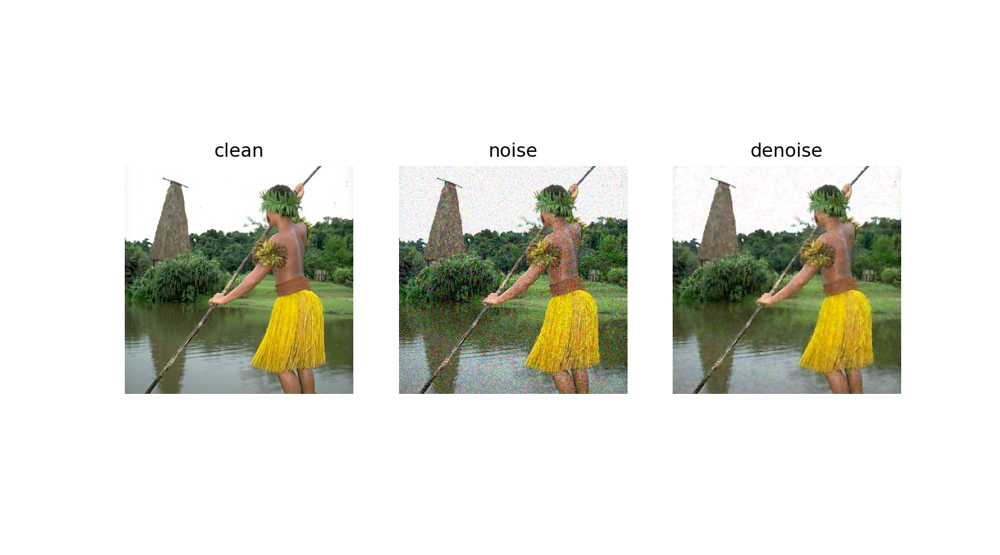

In [13]:
main(img_set,path,'none')

Quantize model...static


/usr/local/lib/python3.6/dist-packages/torch/quantization/observer.py:124: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range will be deprecated in a future release of PyTorch.
  reduce_range will be deprecated in a future release of PyTorch."
/usr/local/lib/python3.6/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)


Elapsed: 1414.09ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


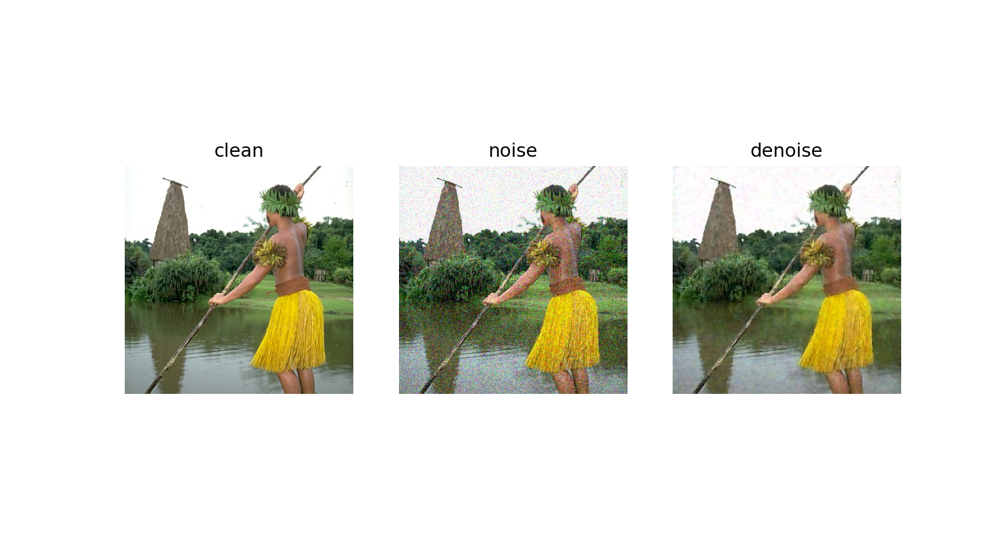

In [14]:
main(img_set,path,'static')

Quantize model...dynamic
Elapsed: 1925.63ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


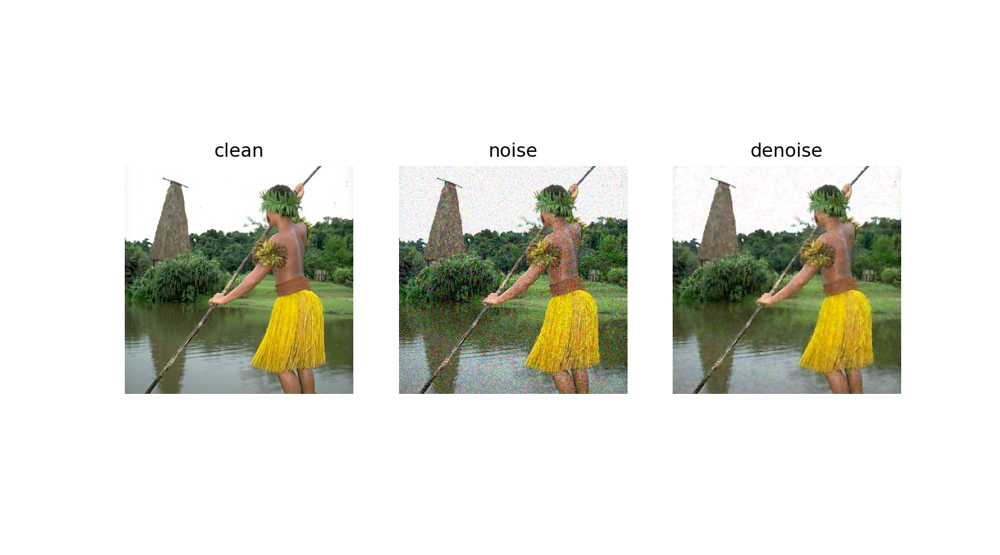

In [15]:
main(img_set,path,'dynamic')

Quantize model...fx_static
Elapsed: 1467.86ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


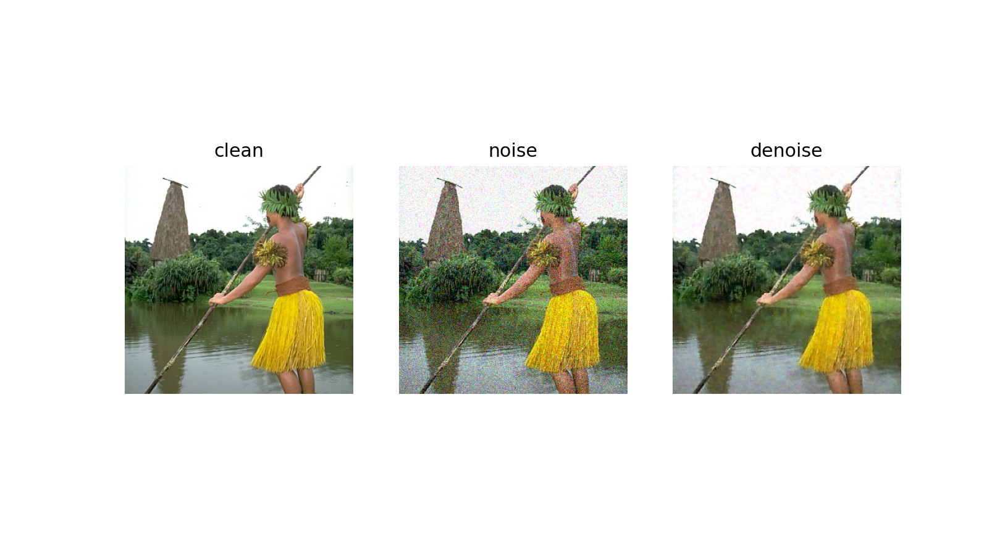

In [16]:
main(img_set,path,'fx_static')

Quantize model...fx_dynamic


/usr/local/lib/python3.6/dist-packages/torch/quantization/fx/quantization_patterns.py:444: UserWarning: dtype combination: (torch.float32, torch.qint8, torch.quint8) is not supported by Conv supported dtype combinations are: [(torch.quint8, torch.qint8, None)]
  "supported dtype combinations are: {}".format(dtypes, supported_dtypes))


Elapsed: 2000.02ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


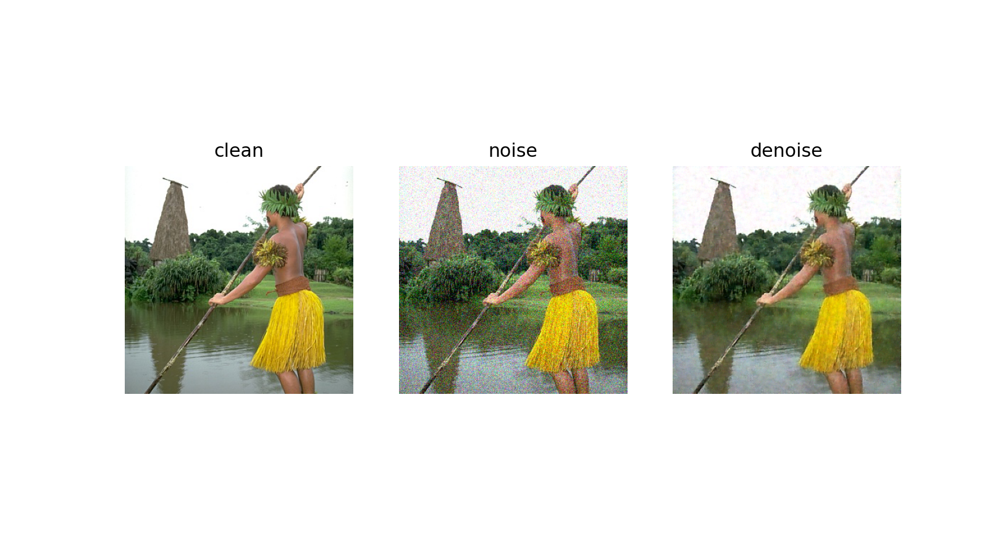

In [17]:
main(img_set,path,'fx_dynamic')

In [18]:
img_set = test_set[1]
path = os.environ.get('TRAINING_DIR')+'/qat/checkpoint.pth'
print('QAT')

QAT


Quantize model...none
Elapsed: 2063.05ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


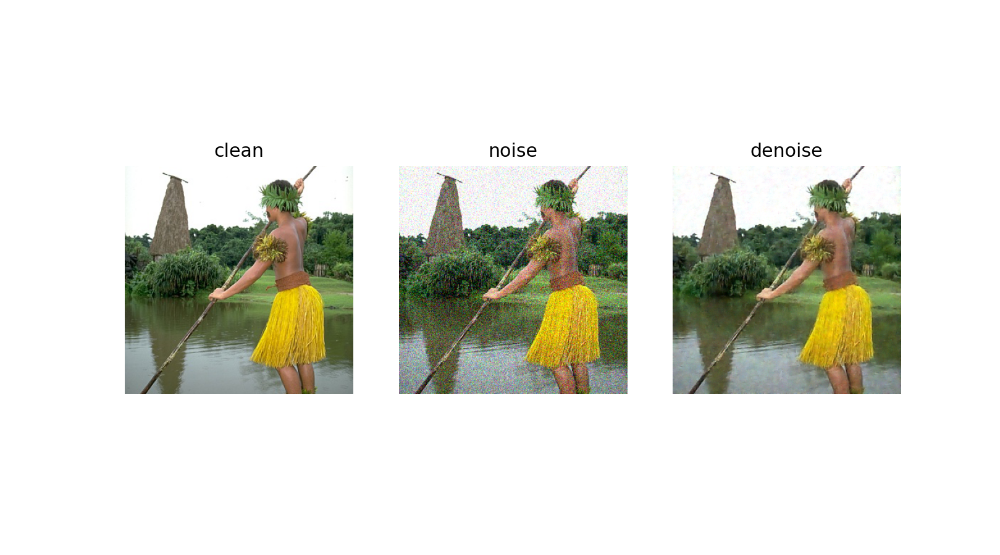

In [19]:
main(img_set,path,'none')

Quantize model...static
Elapsed: 1859.96ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


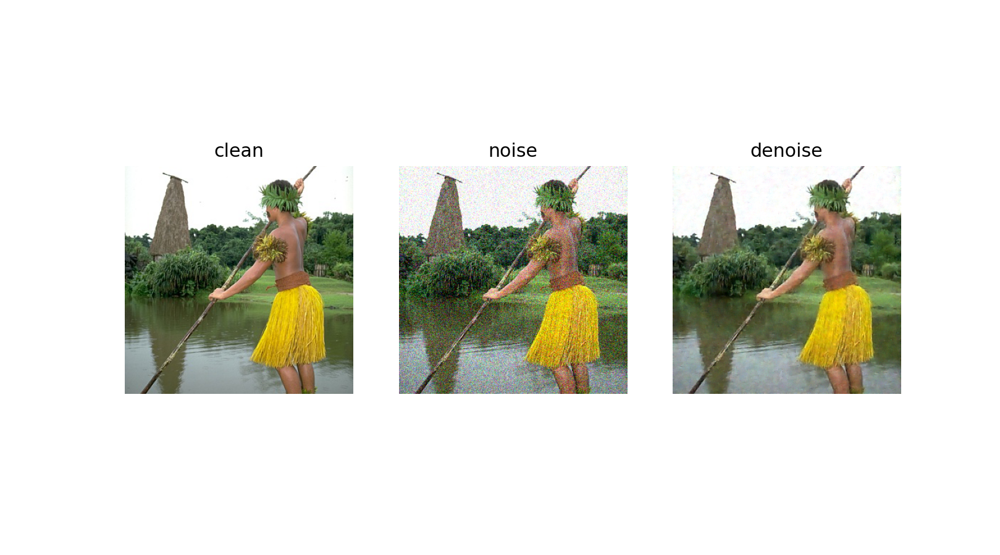

In [20]:
main(img_set,path,'static')

Quantize model...dynamic
Elapsed: 2016.91ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


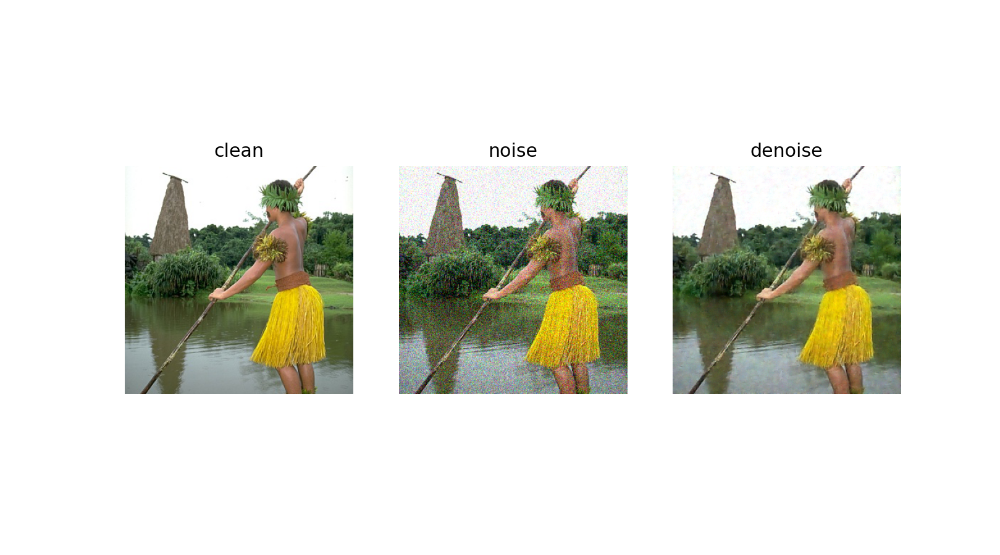

In [21]:
main(img_set,path,'dynamic')

Quantize model...fx_static
Elapsed: 1561.01ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


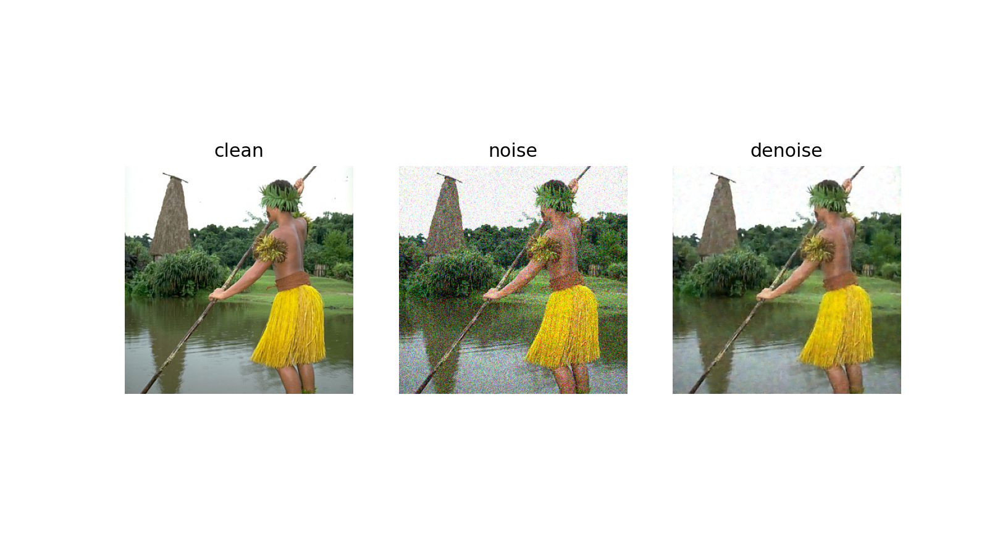

In [22]:
main(img_set,path,'fx_static')

Quantize model...fx_dynamic
Elapsed: 1893.17ms
Image size is torch.Size([3, 320, 320]).


<IPython.core.display.Javascript object>


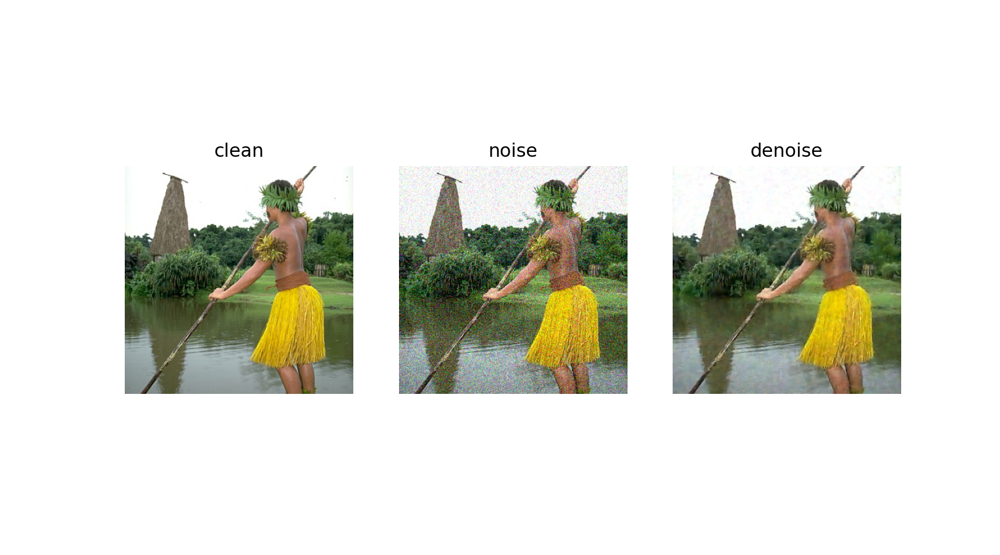

In [23]:
main(img_set,path,'fx_dynamic')

In [25]:
img_set = test_set[1]
path = os.environ.get('TRAINING_DIR')+'/qat_fx_static/checkpoint.pth'
print('QAT_FX_STATIC')

QAT_FX_STATIC


In [26]:
main(img_set,path,'none')

RuntimeError: Error(s) in loading state_dict for QDUDnCNN:
	Missing key(s) in state_dict: "bn.0.weight", "bn.0.bias", "bn.0.running_mean", "bn.0.running_var", "bn.1.weight", "bn.1.bias", "bn.1.running_mean", "bn.1.running_var", "bn.2.weight", "bn.2.bias", "bn.2.running_mean", "bn.2.running_var", "bn.3.weight", "bn.3.bias", "bn.3.running_mean", "bn.3.running_var", "bn.4.weight", "bn.4.bias", "bn.4.running_mean", "bn.4.running_var", "bn.5.weight", "bn.5.bias", "bn.5.running_mean", "bn.5.running_var". 
	Unexpected key(s) in state_dict: "x_activation_post_process_0.fake_quant_enabled", "x_activation_post_process_0.observer_enabled", "x_activation_post_process_0.scale", "x_activation_post_process_0.zero_point", "x_activation_post_process_0.activation_post_process.eps", "x_activation_post_process_0.activation_post_process.min_val", "x_activation_post_process_0.activation_post_process.max_val", "conv_0_activation_post_process_0.fake_quant_enabled", "conv_0_activation_post_process_0.observer_enabled", "conv_0_activation_post_process_0.scale", "conv_0_activation_post_process_0.zero_point", "conv_0_activation_post_process_0.activation_post_process.eps", "conv_0_activation_post_process_0.activation_post_process.min_val", "conv_0_activation_post_process_0.activation_post_process.max_val", "conv_1_activation_post_process_0.fake_quant_enabled", "conv_1_activation_post_process_0.observer_enabled", "conv_1_activation_post_process_0.scale", "conv_1_activation_post_process_0.zero_point", "conv_1_activation_post_process_0.activation_post_process.eps", "conv_1_activation_post_process_0.activation_post_process.min_val", "conv_1_activation_post_process_0.activation_post_process.max_val", "conv_2_activation_post_process_0.fake_quant_enabled", "conv_2_activation_post_process_0.observer_enabled", "conv_2_activation_post_process_0.scale", "conv_2_activation_post_process_0.zero_point", "conv_2_activation_post_process_0.activation_post_process.eps", "conv_2_activation_post_process_0.activation_post_process.min_val", "conv_2_activation_post_process_0.activation_post_process.max_val", "conv_3_activation_post_process_0.fake_quant_enabled", "conv_3_activation_post_process_0.observer_enabled", "conv_3_activation_post_process_0.scale", "conv_3_activation_post_process_0.zero_point", "conv_3_activation_post_process_0.activation_post_process.eps", "conv_3_activation_post_process_0.activation_post_process.min_val", "conv_3_activation_post_process_0.activation_post_process.max_val", "conv_4_activation_post_process_0.fake_quant_enabled", "conv_4_activation_post_process_0.observer_enabled", "conv_4_activation_post_process_0.scale", "conv_4_activation_post_process_0.zero_point", "conv_4_activation_post_process_0.activation_post_process.eps", "conv_4_activation_post_process_0.activation_post_process.min_val", "conv_4_activation_post_process_0.activation_post_process.max_val", "add_activation_post_process_0.fake_quant_enabled", "add_activation_post_process_0.observer_enabled", "add_activation_post_process_0.scale", "add_activation_post_process_0.zero_point", "add_activation_post_process_0.activation_post_process.eps", "add_activation_post_process_0.activation_post_process.min_val", "add_activation_post_process_0.activation_post_process.max_val", "truediv_activation_post_process_0.fake_quant_enabled", "truediv_activation_post_process_0.observer_enabled", "truediv_activation_post_process_0.scale", "truediv_activation_post_process_0.zero_point", "truediv_activation_post_process_0.activation_post_process.eps", "truediv_activation_post_process_0.activation_post_process.min_val", "truediv_activation_post_process_0.activation_post_process.max_val", "conv_5_activation_post_process_0.fake_quant_enabled", "conv_5_activation_post_process_0.observer_enabled", "conv_5_activation_post_process_0.scale", "conv_5_activation_post_process_0.zero_point", "conv_5_activation_post_process_0.activation_post_process.eps", "conv_5_activation_post_process_0.activation_post_process.min_val", "conv_5_activation_post_process_0.activation_post_process.max_val", "add_1_activation_post_process_0.fake_quant_enabled", "add_1_activation_post_process_0.observer_enabled", "add_1_activation_post_process_0.scale", "add_1_activation_post_process_0.zero_point", "add_1_activation_post_process_0.activation_post_process.eps", "add_1_activation_post_process_0.activation_post_process.min_val", "add_1_activation_post_process_0.activation_post_process.max_val", "truediv_1_activation_post_process_0.fake_quant_enabled", "truediv_1_activation_post_process_0.observer_enabled", "truediv_1_activation_post_process_0.scale", "truediv_1_activation_post_process_0.zero_point", "truediv_1_activation_post_process_0.activation_post_process.eps", "truediv_1_activation_post_process_0.activation_post_process.min_val", "truediv_1_activation_post_process_0.activation_post_process.max_val", "conv_6_activation_post_process_0.fake_quant_enabled", "conv_6_activation_post_process_0.observer_enabled", "conv_6_activation_post_process_0.scale", "conv_6_activation_post_process_0.zero_point", "conv_6_activation_post_process_0.activation_post_process.eps", "conv_6_activation_post_process_0.activation_post_process.min_val", "conv_6_activation_post_process_0.activation_post_process.max_val", "conv_7_activation_post_process_0.fake_quant_enabled", "conv_7_activation_post_process_0.observer_enabled", "conv_7_activation_post_process_0.scale", "conv_7_activation_post_process_0.zero_point", "conv_7_activation_post_process_0.activation_post_process.eps", "conv_7_activation_post_process_0.activation_post_process.min_val", "conv_7_activation_post_process_0.activation_post_process.max_val", "add_2_activation_post_process_0.fake_quant_enabled", "add_2_activation_post_process_0.observer_enabled", "add_2_activation_post_process_0.scale", "add_2_activation_post_process_0.zero_point", "add_2_activation_post_process_0.activation_post_process.eps", "add_2_activation_post_process_0.activation_post_process.min_val", "add_2_activation_post_process_0.activation_post_process.max_val", "conv.0.weight_fake_quant.fake_quant_enabled", "conv.0.weight_fake_quant.observer_enabled", "conv.0.weight_fake_quant.scale", "conv.0.weight_fake_quant.zero_point", "conv.0.weight_fake_quant.activation_post_process.eps", "conv.0.weight_fake_quant.activation_post_process.min_val", "conv.0.weight_fake_quant.activation_post_process.max_val", "conv.1.bn.weight", "conv.1.bn.bias", "conv.1.bn.running_mean", "conv.1.bn.running_var", "conv.1.bn.num_batches_tracked", "conv.1.weight_fake_quant.fake_quant_enabled", "conv.1.weight_fake_quant.observer_enabled", "conv.1.weight_fake_quant.scale", "conv.1.weight_fake_quant.zero_point", "conv.1.weight_fake_quant.activation_post_process.eps", "conv.1.weight_fake_quant.activation_post_process.min_val", "conv.1.weight_fake_quant.activation_post_process.max_val", "conv.2.bn.weight", "conv.2.bn.bias", "conv.2.bn.running_mean", "conv.2.bn.running_var", "conv.2.bn.num_batches_tracked", "conv.2.weight_fake_quant.fake_quant_enabled", "conv.2.weight_fake_quant.observer_enabled", "conv.2.weight_fake_quant.scale", "conv.2.weight_fake_quant.zero_point", "conv.2.weight_fake_quant.activation_post_process.eps", "conv.2.weight_fake_quant.activation_post_process.min_val", "conv.2.weight_fake_quant.activation_post_process.max_val", "conv.3.bn.weight", "conv.3.bn.bias", "conv.3.bn.running_mean", "conv.3.bn.running_var", "conv.3.bn.num_batches_tracked", "conv.3.weight_fake_quant.fake_quant_enabled", "conv.3.weight_fake_quant.observer_enabled", "conv.3.weight_fake_quant.scale", "conv.3.weight_fake_quant.zero_point", "conv.3.weight_fake_quant.activation_post_process.eps", "conv.3.weight_fake_quant.activation_post_process.min_val", "conv.3.weight_fake_quant.activation_post_process.max_val", "conv.4.bn.weight", "conv.4.bn.bias", "conv.4.bn.running_mean", "conv.4.bn.running_var", "conv.4.bn.num_batches_tracked", "conv.4.weight_fake_quant.fake_quant_enabled", "conv.4.weight_fake_quant.observer_enabled", "conv.4.weight_fake_quant.scale", "conv.4.weight_fake_quant.zero_point", "conv.4.weight_fake_quant.activation_post_process.eps", "conv.4.weight_fake_quant.activation_post_process.min_val", "conv.4.weight_fake_quant.activation_post_process.max_val", "conv.5.bn.weight", "conv.5.bn.bias", "conv.5.bn.running_mean", "conv.5.bn.running_var", "conv.5.bn.num_batches_tracked", "conv.5.weight_fake_quant.fake_quant_enabled", "conv.5.weight_fake_quant.observer_enabled", "conv.5.weight_fake_quant.scale", "conv.5.weight_fake_quant.zero_point", "conv.5.weight_fake_quant.activation_post_process.eps", "conv.5.weight_fake_quant.activation_post_process.min_val", "conv.5.weight_fake_quant.activation_post_process.max_val", "conv.6.bn.weight", "conv.6.bn.bias", "conv.6.bn.running_mean", "conv.6.bn.running_var", "conv.6.bn.num_batches_tracked", "conv.6.weight_fake_quant.fake_quant_enabled", "conv.6.weight_fake_quant.observer_enabled", "conv.6.weight_fake_quant.scale", "conv.6.weight_fake_quant.zero_point", "conv.6.weight_fake_quant.activation_post_process.eps", "conv.6.weight_fake_quant.activation_post_process.min_val", "conv.6.weight_fake_quant.activation_post_process.max_val", "conv.7.weight_fake_quant.fake_quant_enabled", "conv.7.weight_fake_quant.observer_enabled", "conv.7.weight_fake_quant.scale", "conv.7.weight_fake_quant.zero_point", "conv.7.weight_fake_quant.activation_post_process.eps", "conv.7.weight_fake_quant.activation_post_process.min_val", "conv.7.weight_fake_quant.activation_post_process.max_val". 

In [27]:
main(img_set,path,'static')

RuntimeError: Error(s) in loading state_dict for QDUDnCNN:
	Missing key(s) in state_dict: "bn.0.weight", "bn.0.bias", "bn.0.running_mean", "bn.0.running_var", "bn.1.weight", "bn.1.bias", "bn.1.running_mean", "bn.1.running_var", "bn.2.weight", "bn.2.bias", "bn.2.running_mean", "bn.2.running_var", "bn.3.weight", "bn.3.bias", "bn.3.running_mean", "bn.3.running_var", "bn.4.weight", "bn.4.bias", "bn.4.running_mean", "bn.4.running_var", "bn.5.weight", "bn.5.bias", "bn.5.running_mean", "bn.5.running_var". 
	Unexpected key(s) in state_dict: "x_activation_post_process_0.fake_quant_enabled", "x_activation_post_process_0.observer_enabled", "x_activation_post_process_0.scale", "x_activation_post_process_0.zero_point", "x_activation_post_process_0.activation_post_process.eps", "x_activation_post_process_0.activation_post_process.min_val", "x_activation_post_process_0.activation_post_process.max_val", "conv_0_activation_post_process_0.fake_quant_enabled", "conv_0_activation_post_process_0.observer_enabled", "conv_0_activation_post_process_0.scale", "conv_0_activation_post_process_0.zero_point", "conv_0_activation_post_process_0.activation_post_process.eps", "conv_0_activation_post_process_0.activation_post_process.min_val", "conv_0_activation_post_process_0.activation_post_process.max_val", "conv_1_activation_post_process_0.fake_quant_enabled", "conv_1_activation_post_process_0.observer_enabled", "conv_1_activation_post_process_0.scale", "conv_1_activation_post_process_0.zero_point", "conv_1_activation_post_process_0.activation_post_process.eps", "conv_1_activation_post_process_0.activation_post_process.min_val", "conv_1_activation_post_process_0.activation_post_process.max_val", "conv_2_activation_post_process_0.fake_quant_enabled", "conv_2_activation_post_process_0.observer_enabled", "conv_2_activation_post_process_0.scale", "conv_2_activation_post_process_0.zero_point", "conv_2_activation_post_process_0.activation_post_process.eps", "conv_2_activation_post_process_0.activation_post_process.min_val", "conv_2_activation_post_process_0.activation_post_process.max_val", "conv_3_activation_post_process_0.fake_quant_enabled", "conv_3_activation_post_process_0.observer_enabled", "conv_3_activation_post_process_0.scale", "conv_3_activation_post_process_0.zero_point", "conv_3_activation_post_process_0.activation_post_process.eps", "conv_3_activation_post_process_0.activation_post_process.min_val", "conv_3_activation_post_process_0.activation_post_process.max_val", "conv_4_activation_post_process_0.fake_quant_enabled", "conv_4_activation_post_process_0.observer_enabled", "conv_4_activation_post_process_0.scale", "conv_4_activation_post_process_0.zero_point", "conv_4_activation_post_process_0.activation_post_process.eps", "conv_4_activation_post_process_0.activation_post_process.min_val", "conv_4_activation_post_process_0.activation_post_process.max_val", "add_activation_post_process_0.fake_quant_enabled", "add_activation_post_process_0.observer_enabled", "add_activation_post_process_0.scale", "add_activation_post_process_0.zero_point", "add_activation_post_process_0.activation_post_process.eps", "add_activation_post_process_0.activation_post_process.min_val", "add_activation_post_process_0.activation_post_process.max_val", "truediv_activation_post_process_0.fake_quant_enabled", "truediv_activation_post_process_0.observer_enabled", "truediv_activation_post_process_0.scale", "truediv_activation_post_process_0.zero_point", "truediv_activation_post_process_0.activation_post_process.eps", "truediv_activation_post_process_0.activation_post_process.min_val", "truediv_activation_post_process_0.activation_post_process.max_val", "conv_5_activation_post_process_0.fake_quant_enabled", "conv_5_activation_post_process_0.observer_enabled", "conv_5_activation_post_process_0.scale", "conv_5_activation_post_process_0.zero_point", "conv_5_activation_post_process_0.activation_post_process.eps", "conv_5_activation_post_process_0.activation_post_process.min_val", "conv_5_activation_post_process_0.activation_post_process.max_val", "add_1_activation_post_process_0.fake_quant_enabled", "add_1_activation_post_process_0.observer_enabled", "add_1_activation_post_process_0.scale", "add_1_activation_post_process_0.zero_point", "add_1_activation_post_process_0.activation_post_process.eps", "add_1_activation_post_process_0.activation_post_process.min_val", "add_1_activation_post_process_0.activation_post_process.max_val", "truediv_1_activation_post_process_0.fake_quant_enabled", "truediv_1_activation_post_process_0.observer_enabled", "truediv_1_activation_post_process_0.scale", "truediv_1_activation_post_process_0.zero_point", "truediv_1_activation_post_process_0.activation_post_process.eps", "truediv_1_activation_post_process_0.activation_post_process.min_val", "truediv_1_activation_post_process_0.activation_post_process.max_val", "conv_6_activation_post_process_0.fake_quant_enabled", "conv_6_activation_post_process_0.observer_enabled", "conv_6_activation_post_process_0.scale", "conv_6_activation_post_process_0.zero_point", "conv_6_activation_post_process_0.activation_post_process.eps", "conv_6_activation_post_process_0.activation_post_process.min_val", "conv_6_activation_post_process_0.activation_post_process.max_val", "conv_7_activation_post_process_0.fake_quant_enabled", "conv_7_activation_post_process_0.observer_enabled", "conv_7_activation_post_process_0.scale", "conv_7_activation_post_process_0.zero_point", "conv_7_activation_post_process_0.activation_post_process.eps", "conv_7_activation_post_process_0.activation_post_process.min_val", "conv_7_activation_post_process_0.activation_post_process.max_val", "add_2_activation_post_process_0.fake_quant_enabled", "add_2_activation_post_process_0.observer_enabled", "add_2_activation_post_process_0.scale", "add_2_activation_post_process_0.zero_point", "add_2_activation_post_process_0.activation_post_process.eps", "add_2_activation_post_process_0.activation_post_process.min_val", "add_2_activation_post_process_0.activation_post_process.max_val", "conv.0.weight_fake_quant.fake_quant_enabled", "conv.0.weight_fake_quant.observer_enabled", "conv.0.weight_fake_quant.scale", "conv.0.weight_fake_quant.zero_point", "conv.0.weight_fake_quant.activation_post_process.eps", "conv.0.weight_fake_quant.activation_post_process.min_val", "conv.0.weight_fake_quant.activation_post_process.max_val", "conv.1.bn.weight", "conv.1.bn.bias", "conv.1.bn.running_mean", "conv.1.bn.running_var", "conv.1.bn.num_batches_tracked", "conv.1.weight_fake_quant.fake_quant_enabled", "conv.1.weight_fake_quant.observer_enabled", "conv.1.weight_fake_quant.scale", "conv.1.weight_fake_quant.zero_point", "conv.1.weight_fake_quant.activation_post_process.eps", "conv.1.weight_fake_quant.activation_post_process.min_val", "conv.1.weight_fake_quant.activation_post_process.max_val", "conv.2.bn.weight", "conv.2.bn.bias", "conv.2.bn.running_mean", "conv.2.bn.running_var", "conv.2.bn.num_batches_tracked", "conv.2.weight_fake_quant.fake_quant_enabled", "conv.2.weight_fake_quant.observer_enabled", "conv.2.weight_fake_quant.scale", "conv.2.weight_fake_quant.zero_point", "conv.2.weight_fake_quant.activation_post_process.eps", "conv.2.weight_fake_quant.activation_post_process.min_val", "conv.2.weight_fake_quant.activation_post_process.max_val", "conv.3.bn.weight", "conv.3.bn.bias", "conv.3.bn.running_mean", "conv.3.bn.running_var", "conv.3.bn.num_batches_tracked", "conv.3.weight_fake_quant.fake_quant_enabled", "conv.3.weight_fake_quant.observer_enabled", "conv.3.weight_fake_quant.scale", "conv.3.weight_fake_quant.zero_point", "conv.3.weight_fake_quant.activation_post_process.eps", "conv.3.weight_fake_quant.activation_post_process.min_val", "conv.3.weight_fake_quant.activation_post_process.max_val", "conv.4.bn.weight", "conv.4.bn.bias", "conv.4.bn.running_mean", "conv.4.bn.running_var", "conv.4.bn.num_batches_tracked", "conv.4.weight_fake_quant.fake_quant_enabled", "conv.4.weight_fake_quant.observer_enabled", "conv.4.weight_fake_quant.scale", "conv.4.weight_fake_quant.zero_point", "conv.4.weight_fake_quant.activation_post_process.eps", "conv.4.weight_fake_quant.activation_post_process.min_val", "conv.4.weight_fake_quant.activation_post_process.max_val", "conv.5.bn.weight", "conv.5.bn.bias", "conv.5.bn.running_mean", "conv.5.bn.running_var", "conv.5.bn.num_batches_tracked", "conv.5.weight_fake_quant.fake_quant_enabled", "conv.5.weight_fake_quant.observer_enabled", "conv.5.weight_fake_quant.scale", "conv.5.weight_fake_quant.zero_point", "conv.5.weight_fake_quant.activation_post_process.eps", "conv.5.weight_fake_quant.activation_post_process.min_val", "conv.5.weight_fake_quant.activation_post_process.max_val", "conv.6.bn.weight", "conv.6.bn.bias", "conv.6.bn.running_mean", "conv.6.bn.running_var", "conv.6.bn.num_batches_tracked", "conv.6.weight_fake_quant.fake_quant_enabled", "conv.6.weight_fake_quant.observer_enabled", "conv.6.weight_fake_quant.scale", "conv.6.weight_fake_quant.zero_point", "conv.6.weight_fake_quant.activation_post_process.eps", "conv.6.weight_fake_quant.activation_post_process.min_val", "conv.6.weight_fake_quant.activation_post_process.max_val", "conv.7.weight_fake_quant.fake_quant_enabled", "conv.7.weight_fake_quant.observer_enabled", "conv.7.weight_fake_quant.scale", "conv.7.weight_fake_quant.zero_point", "conv.7.weight_fake_quant.activation_post_process.eps", "conv.7.weight_fake_quant.activation_post_process.min_val", "conv.7.weight_fake_quant.activation_post_process.max_val". 

In [28]:
main(img_set,path,'dynamic')

RuntimeError: Error(s) in loading state_dict for QDUDnCNN:
	Missing key(s) in state_dict: "bn.0.weight", "bn.0.bias", "bn.0.running_mean", "bn.0.running_var", "bn.1.weight", "bn.1.bias", "bn.1.running_mean", "bn.1.running_var", "bn.2.weight", "bn.2.bias", "bn.2.running_mean", "bn.2.running_var", "bn.3.weight", "bn.3.bias", "bn.3.running_mean", "bn.3.running_var", "bn.4.weight", "bn.4.bias", "bn.4.running_mean", "bn.4.running_var", "bn.5.weight", "bn.5.bias", "bn.5.running_mean", "bn.5.running_var". 
	Unexpected key(s) in state_dict: "x_activation_post_process_0.fake_quant_enabled", "x_activation_post_process_0.observer_enabled", "x_activation_post_process_0.scale", "x_activation_post_process_0.zero_point", "x_activation_post_process_0.activation_post_process.eps", "x_activation_post_process_0.activation_post_process.min_val", "x_activation_post_process_0.activation_post_process.max_val", "conv_0_activation_post_process_0.fake_quant_enabled", "conv_0_activation_post_process_0.observer_enabled", "conv_0_activation_post_process_0.scale", "conv_0_activation_post_process_0.zero_point", "conv_0_activation_post_process_0.activation_post_process.eps", "conv_0_activation_post_process_0.activation_post_process.min_val", "conv_0_activation_post_process_0.activation_post_process.max_val", "conv_1_activation_post_process_0.fake_quant_enabled", "conv_1_activation_post_process_0.observer_enabled", "conv_1_activation_post_process_0.scale", "conv_1_activation_post_process_0.zero_point", "conv_1_activation_post_process_0.activation_post_process.eps", "conv_1_activation_post_process_0.activation_post_process.min_val", "conv_1_activation_post_process_0.activation_post_process.max_val", "conv_2_activation_post_process_0.fake_quant_enabled", "conv_2_activation_post_process_0.observer_enabled", "conv_2_activation_post_process_0.scale", "conv_2_activation_post_process_0.zero_point", "conv_2_activation_post_process_0.activation_post_process.eps", "conv_2_activation_post_process_0.activation_post_process.min_val", "conv_2_activation_post_process_0.activation_post_process.max_val", "conv_3_activation_post_process_0.fake_quant_enabled", "conv_3_activation_post_process_0.observer_enabled", "conv_3_activation_post_process_0.scale", "conv_3_activation_post_process_0.zero_point", "conv_3_activation_post_process_0.activation_post_process.eps", "conv_3_activation_post_process_0.activation_post_process.min_val", "conv_3_activation_post_process_0.activation_post_process.max_val", "conv_4_activation_post_process_0.fake_quant_enabled", "conv_4_activation_post_process_0.observer_enabled", "conv_4_activation_post_process_0.scale", "conv_4_activation_post_process_0.zero_point", "conv_4_activation_post_process_0.activation_post_process.eps", "conv_4_activation_post_process_0.activation_post_process.min_val", "conv_4_activation_post_process_0.activation_post_process.max_val", "add_activation_post_process_0.fake_quant_enabled", "add_activation_post_process_0.observer_enabled", "add_activation_post_process_0.scale", "add_activation_post_process_0.zero_point", "add_activation_post_process_0.activation_post_process.eps", "add_activation_post_process_0.activation_post_process.min_val", "add_activation_post_process_0.activation_post_process.max_val", "truediv_activation_post_process_0.fake_quant_enabled", "truediv_activation_post_process_0.observer_enabled", "truediv_activation_post_process_0.scale", "truediv_activation_post_process_0.zero_point", "truediv_activation_post_process_0.activation_post_process.eps", "truediv_activation_post_process_0.activation_post_process.min_val", "truediv_activation_post_process_0.activation_post_process.max_val", "conv_5_activation_post_process_0.fake_quant_enabled", "conv_5_activation_post_process_0.observer_enabled", "conv_5_activation_post_process_0.scale", "conv_5_activation_post_process_0.zero_point", "conv_5_activation_post_process_0.activation_post_process.eps", "conv_5_activation_post_process_0.activation_post_process.min_val", "conv_5_activation_post_process_0.activation_post_process.max_val", "add_1_activation_post_process_0.fake_quant_enabled", "add_1_activation_post_process_0.observer_enabled", "add_1_activation_post_process_0.scale", "add_1_activation_post_process_0.zero_point", "add_1_activation_post_process_0.activation_post_process.eps", "add_1_activation_post_process_0.activation_post_process.min_val", "add_1_activation_post_process_0.activation_post_process.max_val", "truediv_1_activation_post_process_0.fake_quant_enabled", "truediv_1_activation_post_process_0.observer_enabled", "truediv_1_activation_post_process_0.scale", "truediv_1_activation_post_process_0.zero_point", "truediv_1_activation_post_process_0.activation_post_process.eps", "truediv_1_activation_post_process_0.activation_post_process.min_val", "truediv_1_activation_post_process_0.activation_post_process.max_val", "conv_6_activation_post_process_0.fake_quant_enabled", "conv_6_activation_post_process_0.observer_enabled", "conv_6_activation_post_process_0.scale", "conv_6_activation_post_process_0.zero_point", "conv_6_activation_post_process_0.activation_post_process.eps", "conv_6_activation_post_process_0.activation_post_process.min_val", "conv_6_activation_post_process_0.activation_post_process.max_val", "conv_7_activation_post_process_0.fake_quant_enabled", "conv_7_activation_post_process_0.observer_enabled", "conv_7_activation_post_process_0.scale", "conv_7_activation_post_process_0.zero_point", "conv_7_activation_post_process_0.activation_post_process.eps", "conv_7_activation_post_process_0.activation_post_process.min_val", "conv_7_activation_post_process_0.activation_post_process.max_val", "add_2_activation_post_process_0.fake_quant_enabled", "add_2_activation_post_process_0.observer_enabled", "add_2_activation_post_process_0.scale", "add_2_activation_post_process_0.zero_point", "add_2_activation_post_process_0.activation_post_process.eps", "add_2_activation_post_process_0.activation_post_process.min_val", "add_2_activation_post_process_0.activation_post_process.max_val", "conv.0.weight_fake_quant.fake_quant_enabled", "conv.0.weight_fake_quant.observer_enabled", "conv.0.weight_fake_quant.scale", "conv.0.weight_fake_quant.zero_point", "conv.0.weight_fake_quant.activation_post_process.eps", "conv.0.weight_fake_quant.activation_post_process.min_val", "conv.0.weight_fake_quant.activation_post_process.max_val", "conv.1.bn.weight", "conv.1.bn.bias", "conv.1.bn.running_mean", "conv.1.bn.running_var", "conv.1.bn.num_batches_tracked", "conv.1.weight_fake_quant.fake_quant_enabled", "conv.1.weight_fake_quant.observer_enabled", "conv.1.weight_fake_quant.scale", "conv.1.weight_fake_quant.zero_point", "conv.1.weight_fake_quant.activation_post_process.eps", "conv.1.weight_fake_quant.activation_post_process.min_val", "conv.1.weight_fake_quant.activation_post_process.max_val", "conv.2.bn.weight", "conv.2.bn.bias", "conv.2.bn.running_mean", "conv.2.bn.running_var", "conv.2.bn.num_batches_tracked", "conv.2.weight_fake_quant.fake_quant_enabled", "conv.2.weight_fake_quant.observer_enabled", "conv.2.weight_fake_quant.scale", "conv.2.weight_fake_quant.zero_point", "conv.2.weight_fake_quant.activation_post_process.eps", "conv.2.weight_fake_quant.activation_post_process.min_val", "conv.2.weight_fake_quant.activation_post_process.max_val", "conv.3.bn.weight", "conv.3.bn.bias", "conv.3.bn.running_mean", "conv.3.bn.running_var", "conv.3.bn.num_batches_tracked", "conv.3.weight_fake_quant.fake_quant_enabled", "conv.3.weight_fake_quant.observer_enabled", "conv.3.weight_fake_quant.scale", "conv.3.weight_fake_quant.zero_point", "conv.3.weight_fake_quant.activation_post_process.eps", "conv.3.weight_fake_quant.activation_post_process.min_val", "conv.3.weight_fake_quant.activation_post_process.max_val", "conv.4.bn.weight", "conv.4.bn.bias", "conv.4.bn.running_mean", "conv.4.bn.running_var", "conv.4.bn.num_batches_tracked", "conv.4.weight_fake_quant.fake_quant_enabled", "conv.4.weight_fake_quant.observer_enabled", "conv.4.weight_fake_quant.scale", "conv.4.weight_fake_quant.zero_point", "conv.4.weight_fake_quant.activation_post_process.eps", "conv.4.weight_fake_quant.activation_post_process.min_val", "conv.4.weight_fake_quant.activation_post_process.max_val", "conv.5.bn.weight", "conv.5.bn.bias", "conv.5.bn.running_mean", "conv.5.bn.running_var", "conv.5.bn.num_batches_tracked", "conv.5.weight_fake_quant.fake_quant_enabled", "conv.5.weight_fake_quant.observer_enabled", "conv.5.weight_fake_quant.scale", "conv.5.weight_fake_quant.zero_point", "conv.5.weight_fake_quant.activation_post_process.eps", "conv.5.weight_fake_quant.activation_post_process.min_val", "conv.5.weight_fake_quant.activation_post_process.max_val", "conv.6.bn.weight", "conv.6.bn.bias", "conv.6.bn.running_mean", "conv.6.bn.running_var", "conv.6.bn.num_batches_tracked", "conv.6.weight_fake_quant.fake_quant_enabled", "conv.6.weight_fake_quant.observer_enabled", "conv.6.weight_fake_quant.scale", "conv.6.weight_fake_quant.zero_point", "conv.6.weight_fake_quant.activation_post_process.eps", "conv.6.weight_fake_quant.activation_post_process.min_val", "conv.6.weight_fake_quant.activation_post_process.max_val", "conv.7.weight_fake_quant.fake_quant_enabled", "conv.7.weight_fake_quant.observer_enabled", "conv.7.weight_fake_quant.scale", "conv.7.weight_fake_quant.zero_point", "conv.7.weight_fake_quant.activation_post_process.eps", "conv.7.weight_fake_quant.activation_post_process.min_val", "conv.7.weight_fake_quant.activation_post_process.max_val". 

In [29]:
main(img_set,path,'fx_static')

RuntimeError: Error(s) in loading state_dict for QDUDnCNN:
	Missing key(s) in state_dict: "bn.0.weight", "bn.0.bias", "bn.0.running_mean", "bn.0.running_var", "bn.1.weight", "bn.1.bias", "bn.1.running_mean", "bn.1.running_var", "bn.2.weight", "bn.2.bias", "bn.2.running_mean", "bn.2.running_var", "bn.3.weight", "bn.3.bias", "bn.3.running_mean", "bn.3.running_var", "bn.4.weight", "bn.4.bias", "bn.4.running_mean", "bn.4.running_var", "bn.5.weight", "bn.5.bias", "bn.5.running_mean", "bn.5.running_var". 
	Unexpected key(s) in state_dict: "x_activation_post_process_0.fake_quant_enabled", "x_activation_post_process_0.observer_enabled", "x_activation_post_process_0.scale", "x_activation_post_process_0.zero_point", "x_activation_post_process_0.activation_post_process.eps", "x_activation_post_process_0.activation_post_process.min_val", "x_activation_post_process_0.activation_post_process.max_val", "conv_0_activation_post_process_0.fake_quant_enabled", "conv_0_activation_post_process_0.observer_enabled", "conv_0_activation_post_process_0.scale", "conv_0_activation_post_process_0.zero_point", "conv_0_activation_post_process_0.activation_post_process.eps", "conv_0_activation_post_process_0.activation_post_process.min_val", "conv_0_activation_post_process_0.activation_post_process.max_val", "conv_1_activation_post_process_0.fake_quant_enabled", "conv_1_activation_post_process_0.observer_enabled", "conv_1_activation_post_process_0.scale", "conv_1_activation_post_process_0.zero_point", "conv_1_activation_post_process_0.activation_post_process.eps", "conv_1_activation_post_process_0.activation_post_process.min_val", "conv_1_activation_post_process_0.activation_post_process.max_val", "conv_2_activation_post_process_0.fake_quant_enabled", "conv_2_activation_post_process_0.observer_enabled", "conv_2_activation_post_process_0.scale", "conv_2_activation_post_process_0.zero_point", "conv_2_activation_post_process_0.activation_post_process.eps", "conv_2_activation_post_process_0.activation_post_process.min_val", "conv_2_activation_post_process_0.activation_post_process.max_val", "conv_3_activation_post_process_0.fake_quant_enabled", "conv_3_activation_post_process_0.observer_enabled", "conv_3_activation_post_process_0.scale", "conv_3_activation_post_process_0.zero_point", "conv_3_activation_post_process_0.activation_post_process.eps", "conv_3_activation_post_process_0.activation_post_process.min_val", "conv_3_activation_post_process_0.activation_post_process.max_val", "conv_4_activation_post_process_0.fake_quant_enabled", "conv_4_activation_post_process_0.observer_enabled", "conv_4_activation_post_process_0.scale", "conv_4_activation_post_process_0.zero_point", "conv_4_activation_post_process_0.activation_post_process.eps", "conv_4_activation_post_process_0.activation_post_process.min_val", "conv_4_activation_post_process_0.activation_post_process.max_val", "add_activation_post_process_0.fake_quant_enabled", "add_activation_post_process_0.observer_enabled", "add_activation_post_process_0.scale", "add_activation_post_process_0.zero_point", "add_activation_post_process_0.activation_post_process.eps", "add_activation_post_process_0.activation_post_process.min_val", "add_activation_post_process_0.activation_post_process.max_val", "truediv_activation_post_process_0.fake_quant_enabled", "truediv_activation_post_process_0.observer_enabled", "truediv_activation_post_process_0.scale", "truediv_activation_post_process_0.zero_point", "truediv_activation_post_process_0.activation_post_process.eps", "truediv_activation_post_process_0.activation_post_process.min_val", "truediv_activation_post_process_0.activation_post_process.max_val", "conv_5_activation_post_process_0.fake_quant_enabled", "conv_5_activation_post_process_0.observer_enabled", "conv_5_activation_post_process_0.scale", "conv_5_activation_post_process_0.zero_point", "conv_5_activation_post_process_0.activation_post_process.eps", "conv_5_activation_post_process_0.activation_post_process.min_val", "conv_5_activation_post_process_0.activation_post_process.max_val", "add_1_activation_post_process_0.fake_quant_enabled", "add_1_activation_post_process_0.observer_enabled", "add_1_activation_post_process_0.scale", "add_1_activation_post_process_0.zero_point", "add_1_activation_post_process_0.activation_post_process.eps", "add_1_activation_post_process_0.activation_post_process.min_val", "add_1_activation_post_process_0.activation_post_process.max_val", "truediv_1_activation_post_process_0.fake_quant_enabled", "truediv_1_activation_post_process_0.observer_enabled", "truediv_1_activation_post_process_0.scale", "truediv_1_activation_post_process_0.zero_point", "truediv_1_activation_post_process_0.activation_post_process.eps", "truediv_1_activation_post_process_0.activation_post_process.min_val", "truediv_1_activation_post_process_0.activation_post_process.max_val", "conv_6_activation_post_process_0.fake_quant_enabled", "conv_6_activation_post_process_0.observer_enabled", "conv_6_activation_post_process_0.scale", "conv_6_activation_post_process_0.zero_point", "conv_6_activation_post_process_0.activation_post_process.eps", "conv_6_activation_post_process_0.activation_post_process.min_val", "conv_6_activation_post_process_0.activation_post_process.max_val", "conv_7_activation_post_process_0.fake_quant_enabled", "conv_7_activation_post_process_0.observer_enabled", "conv_7_activation_post_process_0.scale", "conv_7_activation_post_process_0.zero_point", "conv_7_activation_post_process_0.activation_post_process.eps", "conv_7_activation_post_process_0.activation_post_process.min_val", "conv_7_activation_post_process_0.activation_post_process.max_val", "add_2_activation_post_process_0.fake_quant_enabled", "add_2_activation_post_process_0.observer_enabled", "add_2_activation_post_process_0.scale", "add_2_activation_post_process_0.zero_point", "add_2_activation_post_process_0.activation_post_process.eps", "add_2_activation_post_process_0.activation_post_process.min_val", "add_2_activation_post_process_0.activation_post_process.max_val", "conv.0.weight_fake_quant.fake_quant_enabled", "conv.0.weight_fake_quant.observer_enabled", "conv.0.weight_fake_quant.scale", "conv.0.weight_fake_quant.zero_point", "conv.0.weight_fake_quant.activation_post_process.eps", "conv.0.weight_fake_quant.activation_post_process.min_val", "conv.0.weight_fake_quant.activation_post_process.max_val", "conv.1.bn.weight", "conv.1.bn.bias", "conv.1.bn.running_mean", "conv.1.bn.running_var", "conv.1.bn.num_batches_tracked", "conv.1.weight_fake_quant.fake_quant_enabled", "conv.1.weight_fake_quant.observer_enabled", "conv.1.weight_fake_quant.scale", "conv.1.weight_fake_quant.zero_point", "conv.1.weight_fake_quant.activation_post_process.eps", "conv.1.weight_fake_quant.activation_post_process.min_val", "conv.1.weight_fake_quant.activation_post_process.max_val", "conv.2.bn.weight", "conv.2.bn.bias", "conv.2.bn.running_mean", "conv.2.bn.running_var", "conv.2.bn.num_batches_tracked", "conv.2.weight_fake_quant.fake_quant_enabled", "conv.2.weight_fake_quant.observer_enabled", "conv.2.weight_fake_quant.scale", "conv.2.weight_fake_quant.zero_point", "conv.2.weight_fake_quant.activation_post_process.eps", "conv.2.weight_fake_quant.activation_post_process.min_val", "conv.2.weight_fake_quant.activation_post_process.max_val", "conv.3.bn.weight", "conv.3.bn.bias", "conv.3.bn.running_mean", "conv.3.bn.running_var", "conv.3.bn.num_batches_tracked", "conv.3.weight_fake_quant.fake_quant_enabled", "conv.3.weight_fake_quant.observer_enabled", "conv.3.weight_fake_quant.scale", "conv.3.weight_fake_quant.zero_point", "conv.3.weight_fake_quant.activation_post_process.eps", "conv.3.weight_fake_quant.activation_post_process.min_val", "conv.3.weight_fake_quant.activation_post_process.max_val", "conv.4.bn.weight", "conv.4.bn.bias", "conv.4.bn.running_mean", "conv.4.bn.running_var", "conv.4.bn.num_batches_tracked", "conv.4.weight_fake_quant.fake_quant_enabled", "conv.4.weight_fake_quant.observer_enabled", "conv.4.weight_fake_quant.scale", "conv.4.weight_fake_quant.zero_point", "conv.4.weight_fake_quant.activation_post_process.eps", "conv.4.weight_fake_quant.activation_post_process.min_val", "conv.4.weight_fake_quant.activation_post_process.max_val", "conv.5.bn.weight", "conv.5.bn.bias", "conv.5.bn.running_mean", "conv.5.bn.running_var", "conv.5.bn.num_batches_tracked", "conv.5.weight_fake_quant.fake_quant_enabled", "conv.5.weight_fake_quant.observer_enabled", "conv.5.weight_fake_quant.scale", "conv.5.weight_fake_quant.zero_point", "conv.5.weight_fake_quant.activation_post_process.eps", "conv.5.weight_fake_quant.activation_post_process.min_val", "conv.5.weight_fake_quant.activation_post_process.max_val", "conv.6.bn.weight", "conv.6.bn.bias", "conv.6.bn.running_mean", "conv.6.bn.running_var", "conv.6.bn.num_batches_tracked", "conv.6.weight_fake_quant.fake_quant_enabled", "conv.6.weight_fake_quant.observer_enabled", "conv.6.weight_fake_quant.scale", "conv.6.weight_fake_quant.zero_point", "conv.6.weight_fake_quant.activation_post_process.eps", "conv.6.weight_fake_quant.activation_post_process.min_val", "conv.6.weight_fake_quant.activation_post_process.max_val", "conv.7.weight_fake_quant.fake_quant_enabled", "conv.7.weight_fake_quant.observer_enabled", "conv.7.weight_fake_quant.scale", "conv.7.weight_fake_quant.zero_point", "conv.7.weight_fake_quant.activation_post_process.eps", "conv.7.weight_fake_quant.activation_post_process.min_val", "conv.7.weight_fake_quant.activation_post_process.max_val". 

In [30]:
main(img_set,path,'fx_dynamic')

RuntimeError: Error(s) in loading state_dict for QDUDnCNN:
	Missing key(s) in state_dict: "bn.0.weight", "bn.0.bias", "bn.0.running_mean", "bn.0.running_var", "bn.1.weight", "bn.1.bias", "bn.1.running_mean", "bn.1.running_var", "bn.2.weight", "bn.2.bias", "bn.2.running_mean", "bn.2.running_var", "bn.3.weight", "bn.3.bias", "bn.3.running_mean", "bn.3.running_var", "bn.4.weight", "bn.4.bias", "bn.4.running_mean", "bn.4.running_var", "bn.5.weight", "bn.5.bias", "bn.5.running_mean", "bn.5.running_var". 
	Unexpected key(s) in state_dict: "x_activation_post_process_0.fake_quant_enabled", "x_activation_post_process_0.observer_enabled", "x_activation_post_process_0.scale", "x_activation_post_process_0.zero_point", "x_activation_post_process_0.activation_post_process.eps", "x_activation_post_process_0.activation_post_process.min_val", "x_activation_post_process_0.activation_post_process.max_val", "conv_0_activation_post_process_0.fake_quant_enabled", "conv_0_activation_post_process_0.observer_enabled", "conv_0_activation_post_process_0.scale", "conv_0_activation_post_process_0.zero_point", "conv_0_activation_post_process_0.activation_post_process.eps", "conv_0_activation_post_process_0.activation_post_process.min_val", "conv_0_activation_post_process_0.activation_post_process.max_val", "conv_1_activation_post_process_0.fake_quant_enabled", "conv_1_activation_post_process_0.observer_enabled", "conv_1_activation_post_process_0.scale", "conv_1_activation_post_process_0.zero_point", "conv_1_activation_post_process_0.activation_post_process.eps", "conv_1_activation_post_process_0.activation_post_process.min_val", "conv_1_activation_post_process_0.activation_post_process.max_val", "conv_2_activation_post_process_0.fake_quant_enabled", "conv_2_activation_post_process_0.observer_enabled", "conv_2_activation_post_process_0.scale", "conv_2_activation_post_process_0.zero_point", "conv_2_activation_post_process_0.activation_post_process.eps", "conv_2_activation_post_process_0.activation_post_process.min_val", "conv_2_activation_post_process_0.activation_post_process.max_val", "conv_3_activation_post_process_0.fake_quant_enabled", "conv_3_activation_post_process_0.observer_enabled", "conv_3_activation_post_process_0.scale", "conv_3_activation_post_process_0.zero_point", "conv_3_activation_post_process_0.activation_post_process.eps", "conv_3_activation_post_process_0.activation_post_process.min_val", "conv_3_activation_post_process_0.activation_post_process.max_val", "conv_4_activation_post_process_0.fake_quant_enabled", "conv_4_activation_post_process_0.observer_enabled", "conv_4_activation_post_process_0.scale", "conv_4_activation_post_process_0.zero_point", "conv_4_activation_post_process_0.activation_post_process.eps", "conv_4_activation_post_process_0.activation_post_process.min_val", "conv_4_activation_post_process_0.activation_post_process.max_val", "add_activation_post_process_0.fake_quant_enabled", "add_activation_post_process_0.observer_enabled", "add_activation_post_process_0.scale", "add_activation_post_process_0.zero_point", "add_activation_post_process_0.activation_post_process.eps", "add_activation_post_process_0.activation_post_process.min_val", "add_activation_post_process_0.activation_post_process.max_val", "truediv_activation_post_process_0.fake_quant_enabled", "truediv_activation_post_process_0.observer_enabled", "truediv_activation_post_process_0.scale", "truediv_activation_post_process_0.zero_point", "truediv_activation_post_process_0.activation_post_process.eps", "truediv_activation_post_process_0.activation_post_process.min_val", "truediv_activation_post_process_0.activation_post_process.max_val", "conv_5_activation_post_process_0.fake_quant_enabled", "conv_5_activation_post_process_0.observer_enabled", "conv_5_activation_post_process_0.scale", "conv_5_activation_post_process_0.zero_point", "conv_5_activation_post_process_0.activation_post_process.eps", "conv_5_activation_post_process_0.activation_post_process.min_val", "conv_5_activation_post_process_0.activation_post_process.max_val", "add_1_activation_post_process_0.fake_quant_enabled", "add_1_activation_post_process_0.observer_enabled", "add_1_activation_post_process_0.scale", "add_1_activation_post_process_0.zero_point", "add_1_activation_post_process_0.activation_post_process.eps", "add_1_activation_post_process_0.activation_post_process.min_val", "add_1_activation_post_process_0.activation_post_process.max_val", "truediv_1_activation_post_process_0.fake_quant_enabled", "truediv_1_activation_post_process_0.observer_enabled", "truediv_1_activation_post_process_0.scale", "truediv_1_activation_post_process_0.zero_point", "truediv_1_activation_post_process_0.activation_post_process.eps", "truediv_1_activation_post_process_0.activation_post_process.min_val", "truediv_1_activation_post_process_0.activation_post_process.max_val", "conv_6_activation_post_process_0.fake_quant_enabled", "conv_6_activation_post_process_0.observer_enabled", "conv_6_activation_post_process_0.scale", "conv_6_activation_post_process_0.zero_point", "conv_6_activation_post_process_0.activation_post_process.eps", "conv_6_activation_post_process_0.activation_post_process.min_val", "conv_6_activation_post_process_0.activation_post_process.max_val", "conv_7_activation_post_process_0.fake_quant_enabled", "conv_7_activation_post_process_0.observer_enabled", "conv_7_activation_post_process_0.scale", "conv_7_activation_post_process_0.zero_point", "conv_7_activation_post_process_0.activation_post_process.eps", "conv_7_activation_post_process_0.activation_post_process.min_val", "conv_7_activation_post_process_0.activation_post_process.max_val", "add_2_activation_post_process_0.fake_quant_enabled", "add_2_activation_post_process_0.observer_enabled", "add_2_activation_post_process_0.scale", "add_2_activation_post_process_0.zero_point", "add_2_activation_post_process_0.activation_post_process.eps", "add_2_activation_post_process_0.activation_post_process.min_val", "add_2_activation_post_process_0.activation_post_process.max_val", "conv.0.weight_fake_quant.fake_quant_enabled", "conv.0.weight_fake_quant.observer_enabled", "conv.0.weight_fake_quant.scale", "conv.0.weight_fake_quant.zero_point", "conv.0.weight_fake_quant.activation_post_process.eps", "conv.0.weight_fake_quant.activation_post_process.min_val", "conv.0.weight_fake_quant.activation_post_process.max_val", "conv.1.bn.weight", "conv.1.bn.bias", "conv.1.bn.running_mean", "conv.1.bn.running_var", "conv.1.bn.num_batches_tracked", "conv.1.weight_fake_quant.fake_quant_enabled", "conv.1.weight_fake_quant.observer_enabled", "conv.1.weight_fake_quant.scale", "conv.1.weight_fake_quant.zero_point", "conv.1.weight_fake_quant.activation_post_process.eps", "conv.1.weight_fake_quant.activation_post_process.min_val", "conv.1.weight_fake_quant.activation_post_process.max_val", "conv.2.bn.weight", "conv.2.bn.bias", "conv.2.bn.running_mean", "conv.2.bn.running_var", "conv.2.bn.num_batches_tracked", "conv.2.weight_fake_quant.fake_quant_enabled", "conv.2.weight_fake_quant.observer_enabled", "conv.2.weight_fake_quant.scale", "conv.2.weight_fake_quant.zero_point", "conv.2.weight_fake_quant.activation_post_process.eps", "conv.2.weight_fake_quant.activation_post_process.min_val", "conv.2.weight_fake_quant.activation_post_process.max_val", "conv.3.bn.weight", "conv.3.bn.bias", "conv.3.bn.running_mean", "conv.3.bn.running_var", "conv.3.bn.num_batches_tracked", "conv.3.weight_fake_quant.fake_quant_enabled", "conv.3.weight_fake_quant.observer_enabled", "conv.3.weight_fake_quant.scale", "conv.3.weight_fake_quant.zero_point", "conv.3.weight_fake_quant.activation_post_process.eps", "conv.3.weight_fake_quant.activation_post_process.min_val", "conv.3.weight_fake_quant.activation_post_process.max_val", "conv.4.bn.weight", "conv.4.bn.bias", "conv.4.bn.running_mean", "conv.4.bn.running_var", "conv.4.bn.num_batches_tracked", "conv.4.weight_fake_quant.fake_quant_enabled", "conv.4.weight_fake_quant.observer_enabled", "conv.4.weight_fake_quant.scale", "conv.4.weight_fake_quant.zero_point", "conv.4.weight_fake_quant.activation_post_process.eps", "conv.4.weight_fake_quant.activation_post_process.min_val", "conv.4.weight_fake_quant.activation_post_process.max_val", "conv.5.bn.weight", "conv.5.bn.bias", "conv.5.bn.running_mean", "conv.5.bn.running_var", "conv.5.bn.num_batches_tracked", "conv.5.weight_fake_quant.fake_quant_enabled", "conv.5.weight_fake_quant.observer_enabled", "conv.5.weight_fake_quant.scale", "conv.5.weight_fake_quant.zero_point", "conv.5.weight_fake_quant.activation_post_process.eps", "conv.5.weight_fake_quant.activation_post_process.min_val", "conv.5.weight_fake_quant.activation_post_process.max_val", "conv.6.bn.weight", "conv.6.bn.bias", "conv.6.bn.running_mean", "conv.6.bn.running_var", "conv.6.bn.num_batches_tracked", "conv.6.weight_fake_quant.fake_quant_enabled", "conv.6.weight_fake_quant.observer_enabled", "conv.6.weight_fake_quant.scale", "conv.6.weight_fake_quant.zero_point", "conv.6.weight_fake_quant.activation_post_process.eps", "conv.6.weight_fake_quant.activation_post_process.min_val", "conv.6.weight_fake_quant.activation_post_process.max_val", "conv.7.weight_fake_quant.fake_quant_enabled", "conv.7.weight_fake_quant.observer_enabled", "conv.7.weight_fake_quant.scale", "conv.7.weight_fake_quant.zero_point", "conv.7.weight_fake_quant.activation_post_process.eps", "conv.7.weight_fake_quant.activation_post_process.min_val", "conv.7.weight_fake_quant.activation_post_process.max_val". 

In [31]:
def eval_q(img_set,model_path,quantize='none',display=False): 
    args = Args()
    args.quantize = quantize
    device = 'cpu'
    denoise = load_model(model_path, args.D, args.C, device=device)
    
    img = []
    titles = ['clean', 'noise', 'denoise'] 
    x, clean = img_set
    x = x.unsqueeze(0).to(device)
    
    if display:
        img.append(clean)
        img.append(x[0])

    if args.quantize:
        denoise = quantize_model(args.quantize, denoise, input_example=x)

    t = time.time()
    with torch.no_grad():
        y = denoise(x) 
    if display:
        img.append(y[0])
#    print(f'Elapsed: {(time.time() - t) * 1000:.2f}ms')

    if display:
        fig, axes = plt.subplots(ncols=3, figsize=(9,5), sharex='all', sharey='all')
        for i in range(len(img)):
            myimshow(img[i], ax=axes[i])
            axes[i].set_title(f'{titles[i]}') 
    return (time.time() - t) * 1000, quantize

In [32]:
img_set = test_set[0]

In [33]:
path = os.environ.get('TRAINING_DIR')+'/no_qat/checkpoint.pth' 
print('Non-Quantization Aware Trained Model')
eval_time,q = eval_q(img_set, path, 'none', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms')
eval_time,q = eval_q(img_set, path, 'static', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, 'dynamic', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, 'fx_static', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, 'fx_dynamic', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms')

Non-Quantization Aware Trained Model
Qntization - none: 1874.83ms
Qntization - static: 1406.53ms
Qntization - dynamic: 2004.06ms
Qntization - fx_static: 1570.92ms
Qntization - fx_dynamic: 1973.98ms


In [34]:
path = os.environ.get('TRAINING_DIR')+'/qat/checkpoint.pth' 
print('Quantization Aware Trained Model')
eval_time,q = eval_q(img_set, path, 'none', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms')
eval_time,q = eval_q(img_set, path, 'static', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, 'dynamic', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, 'fx_static', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, 'fx_dynamic', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms')

Quantization Aware Trained Model
Qntization - none: 1928.74ms
Qntization - static: 1584.82ms
Qntization - dynamic: 2168.57ms
Qntization - fx_static: 1795.74ms
Qntization - fx_dynamic: 1989.70ms


In [35]:
path = os.environ.get('TRAINING_DIR')+'/qat_fx_static/checkpoint.pth' 
print('Quantization Aware Trained Model')
eval_time,q = eval_q(img_set, path, 'none', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms')
eval_time,q = eval_q(img_set, path, 'static', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, 'dynamic', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, 'fx_static', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, 'fx_dynamic', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms')

Quantization Aware Trained Model


RuntimeError: Error(s) in loading state_dict for QDUDnCNN:
	Missing key(s) in state_dict: "bn.0.weight", "bn.0.bias", "bn.0.running_mean", "bn.0.running_var", "bn.1.weight", "bn.1.bias", "bn.1.running_mean", "bn.1.running_var", "bn.2.weight", "bn.2.bias", "bn.2.running_mean", "bn.2.running_var", "bn.3.weight", "bn.3.bias", "bn.3.running_mean", "bn.3.running_var", "bn.4.weight", "bn.4.bias", "bn.4.running_mean", "bn.4.running_var", "bn.5.weight", "bn.5.bias", "bn.5.running_mean", "bn.5.running_var". 
	Unexpected key(s) in state_dict: "x_activation_post_process_0.fake_quant_enabled", "x_activation_post_process_0.observer_enabled", "x_activation_post_process_0.scale", "x_activation_post_process_0.zero_point", "x_activation_post_process_0.activation_post_process.eps", "x_activation_post_process_0.activation_post_process.min_val", "x_activation_post_process_0.activation_post_process.max_val", "conv_0_activation_post_process_0.fake_quant_enabled", "conv_0_activation_post_process_0.observer_enabled", "conv_0_activation_post_process_0.scale", "conv_0_activation_post_process_0.zero_point", "conv_0_activation_post_process_0.activation_post_process.eps", "conv_0_activation_post_process_0.activation_post_process.min_val", "conv_0_activation_post_process_0.activation_post_process.max_val", "conv_1_activation_post_process_0.fake_quant_enabled", "conv_1_activation_post_process_0.observer_enabled", "conv_1_activation_post_process_0.scale", "conv_1_activation_post_process_0.zero_point", "conv_1_activation_post_process_0.activation_post_process.eps", "conv_1_activation_post_process_0.activation_post_process.min_val", "conv_1_activation_post_process_0.activation_post_process.max_val", "conv_2_activation_post_process_0.fake_quant_enabled", "conv_2_activation_post_process_0.observer_enabled", "conv_2_activation_post_process_0.scale", "conv_2_activation_post_process_0.zero_point", "conv_2_activation_post_process_0.activation_post_process.eps", "conv_2_activation_post_process_0.activation_post_process.min_val", "conv_2_activation_post_process_0.activation_post_process.max_val", "conv_3_activation_post_process_0.fake_quant_enabled", "conv_3_activation_post_process_0.observer_enabled", "conv_3_activation_post_process_0.scale", "conv_3_activation_post_process_0.zero_point", "conv_3_activation_post_process_0.activation_post_process.eps", "conv_3_activation_post_process_0.activation_post_process.min_val", "conv_3_activation_post_process_0.activation_post_process.max_val", "conv_4_activation_post_process_0.fake_quant_enabled", "conv_4_activation_post_process_0.observer_enabled", "conv_4_activation_post_process_0.scale", "conv_4_activation_post_process_0.zero_point", "conv_4_activation_post_process_0.activation_post_process.eps", "conv_4_activation_post_process_0.activation_post_process.min_val", "conv_4_activation_post_process_0.activation_post_process.max_val", "add_activation_post_process_0.fake_quant_enabled", "add_activation_post_process_0.observer_enabled", "add_activation_post_process_0.scale", "add_activation_post_process_0.zero_point", "add_activation_post_process_0.activation_post_process.eps", "add_activation_post_process_0.activation_post_process.min_val", "add_activation_post_process_0.activation_post_process.max_val", "truediv_activation_post_process_0.fake_quant_enabled", "truediv_activation_post_process_0.observer_enabled", "truediv_activation_post_process_0.scale", "truediv_activation_post_process_0.zero_point", "truediv_activation_post_process_0.activation_post_process.eps", "truediv_activation_post_process_0.activation_post_process.min_val", "truediv_activation_post_process_0.activation_post_process.max_val", "conv_5_activation_post_process_0.fake_quant_enabled", "conv_5_activation_post_process_0.observer_enabled", "conv_5_activation_post_process_0.scale", "conv_5_activation_post_process_0.zero_point", "conv_5_activation_post_process_0.activation_post_process.eps", "conv_5_activation_post_process_0.activation_post_process.min_val", "conv_5_activation_post_process_0.activation_post_process.max_val", "add_1_activation_post_process_0.fake_quant_enabled", "add_1_activation_post_process_0.observer_enabled", "add_1_activation_post_process_0.scale", "add_1_activation_post_process_0.zero_point", "add_1_activation_post_process_0.activation_post_process.eps", "add_1_activation_post_process_0.activation_post_process.min_val", "add_1_activation_post_process_0.activation_post_process.max_val", "truediv_1_activation_post_process_0.fake_quant_enabled", "truediv_1_activation_post_process_0.observer_enabled", "truediv_1_activation_post_process_0.scale", "truediv_1_activation_post_process_0.zero_point", "truediv_1_activation_post_process_0.activation_post_process.eps", "truediv_1_activation_post_process_0.activation_post_process.min_val", "truediv_1_activation_post_process_0.activation_post_process.max_val", "conv_6_activation_post_process_0.fake_quant_enabled", "conv_6_activation_post_process_0.observer_enabled", "conv_6_activation_post_process_0.scale", "conv_6_activation_post_process_0.zero_point", "conv_6_activation_post_process_0.activation_post_process.eps", "conv_6_activation_post_process_0.activation_post_process.min_val", "conv_6_activation_post_process_0.activation_post_process.max_val", "conv_7_activation_post_process_0.fake_quant_enabled", "conv_7_activation_post_process_0.observer_enabled", "conv_7_activation_post_process_0.scale", "conv_7_activation_post_process_0.zero_point", "conv_7_activation_post_process_0.activation_post_process.eps", "conv_7_activation_post_process_0.activation_post_process.min_val", "conv_7_activation_post_process_0.activation_post_process.max_val", "add_2_activation_post_process_0.fake_quant_enabled", "add_2_activation_post_process_0.observer_enabled", "add_2_activation_post_process_0.scale", "add_2_activation_post_process_0.zero_point", "add_2_activation_post_process_0.activation_post_process.eps", "add_2_activation_post_process_0.activation_post_process.min_val", "add_2_activation_post_process_0.activation_post_process.max_val", "conv.0.weight_fake_quant.fake_quant_enabled", "conv.0.weight_fake_quant.observer_enabled", "conv.0.weight_fake_quant.scale", "conv.0.weight_fake_quant.zero_point", "conv.0.weight_fake_quant.activation_post_process.eps", "conv.0.weight_fake_quant.activation_post_process.min_val", "conv.0.weight_fake_quant.activation_post_process.max_val", "conv.1.bn.weight", "conv.1.bn.bias", "conv.1.bn.running_mean", "conv.1.bn.running_var", "conv.1.bn.num_batches_tracked", "conv.1.weight_fake_quant.fake_quant_enabled", "conv.1.weight_fake_quant.observer_enabled", "conv.1.weight_fake_quant.scale", "conv.1.weight_fake_quant.zero_point", "conv.1.weight_fake_quant.activation_post_process.eps", "conv.1.weight_fake_quant.activation_post_process.min_val", "conv.1.weight_fake_quant.activation_post_process.max_val", "conv.2.bn.weight", "conv.2.bn.bias", "conv.2.bn.running_mean", "conv.2.bn.running_var", "conv.2.bn.num_batches_tracked", "conv.2.weight_fake_quant.fake_quant_enabled", "conv.2.weight_fake_quant.observer_enabled", "conv.2.weight_fake_quant.scale", "conv.2.weight_fake_quant.zero_point", "conv.2.weight_fake_quant.activation_post_process.eps", "conv.2.weight_fake_quant.activation_post_process.min_val", "conv.2.weight_fake_quant.activation_post_process.max_val", "conv.3.bn.weight", "conv.3.bn.bias", "conv.3.bn.running_mean", "conv.3.bn.running_var", "conv.3.bn.num_batches_tracked", "conv.3.weight_fake_quant.fake_quant_enabled", "conv.3.weight_fake_quant.observer_enabled", "conv.3.weight_fake_quant.scale", "conv.3.weight_fake_quant.zero_point", "conv.3.weight_fake_quant.activation_post_process.eps", "conv.3.weight_fake_quant.activation_post_process.min_val", "conv.3.weight_fake_quant.activation_post_process.max_val", "conv.4.bn.weight", "conv.4.bn.bias", "conv.4.bn.running_mean", "conv.4.bn.running_var", "conv.4.bn.num_batches_tracked", "conv.4.weight_fake_quant.fake_quant_enabled", "conv.4.weight_fake_quant.observer_enabled", "conv.4.weight_fake_quant.scale", "conv.4.weight_fake_quant.zero_point", "conv.4.weight_fake_quant.activation_post_process.eps", "conv.4.weight_fake_quant.activation_post_process.min_val", "conv.4.weight_fake_quant.activation_post_process.max_val", "conv.5.bn.weight", "conv.5.bn.bias", "conv.5.bn.running_mean", "conv.5.bn.running_var", "conv.5.bn.num_batches_tracked", "conv.5.weight_fake_quant.fake_quant_enabled", "conv.5.weight_fake_quant.observer_enabled", "conv.5.weight_fake_quant.scale", "conv.5.weight_fake_quant.zero_point", "conv.5.weight_fake_quant.activation_post_process.eps", "conv.5.weight_fake_quant.activation_post_process.min_val", "conv.5.weight_fake_quant.activation_post_process.max_val", "conv.6.bn.weight", "conv.6.bn.bias", "conv.6.bn.running_mean", "conv.6.bn.running_var", "conv.6.bn.num_batches_tracked", "conv.6.weight_fake_quant.fake_quant_enabled", "conv.6.weight_fake_quant.observer_enabled", "conv.6.weight_fake_quant.scale", "conv.6.weight_fake_quant.zero_point", "conv.6.weight_fake_quant.activation_post_process.eps", "conv.6.weight_fake_quant.activation_post_process.min_val", "conv.6.weight_fake_quant.activation_post_process.max_val", "conv.7.weight_fake_quant.fake_quant_enabled", "conv.7.weight_fake_quant.observer_enabled", "conv.7.weight_fake_quant.scale", "conv.7.weight_fake_quant.zero_point", "conv.7.weight_fake_quant.activation_post_process.eps", "conv.7.weight_fake_quant.activation_post_process.min_val", "conv.7.weight_fake_quant.activation_post_process.max_val". 